In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Coinex 1Hour Data/diabetic_data2.csv')

In [ ]:
print(len(df))

70699


In [ ]:
#Preprocessing => Step 1: Drop useless columns
question_marks_count = {}
for column in df.columns:
  if df[column].value_counts().get('?', 0)!=0:
    question_marks_count[column] = df[column].value_counts().get('?', 0)
print(question_marks_count)

# Replace '?' in 'race':
df['race'] = df['race'].replace('?', 'unknown')

# Drop 'weight' and 'payer_code' and 'medical_specialty'
df = df.drop(['weight', 'payer_code', 'medical_specialty'], axis=1)

{'race': 1341, 'weight': 68461, 'payer_code': 25689, 'medical_specialty': 34907}


In [ ]:
df_lowerdrops = df.drop(['patient_nbr', 'encounter_id', 'change'], axis=1)
df_manydrops = df.drop(['patient_nbr', 'encounter_id', 'change','time_in_hospital',
                        'num_lab_procedures','num_medications','number_outpatient','number_emergency',
                        'number_inpatient'], axis=1)

In [ ]:
#Preprocessing => Step 2: Check for nulls
print('for lowerdrops:')
print(df_lowerdrops.isnull().sum())
print('for manydrops:')
print(df_manydrops.isnull().sum())

for lowerdrops:
race                        0
gender                      0
age                         0
time_in_hospital            0
num_lab_procedures          0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide                  0
examide                     0
citoglipton                 0
insulin                     0
glyburide-metformin         0
glipizide-metformin         0
glimepiride-pioglitazone    0
metformin-rosiglitazone     0
metformin-pioglitazone  

In [ ]:
#Preprocessing => Step 3: Categorical to numerical
print(df_lowerdrops.dtypes)
df_lowerdrops = df_lowerdrops.replace('No', 0)
df_lowerdrops = df_lowerdrops.replace('Up', 1)
df_lowerdrops = df_lowerdrops.replace('Down', 0.6)
df_lowerdrops = df_lowerdrops.replace('Steady', 0.8)

df_manydrops = df_manydrops.replace('No', 0)
df_manydrops = df_manydrops.replace('Up', 1)
df_manydrops = df_manydrops.replace('Down', 0.6)
df_manydrops = df_manydrops.replace('Steady', 0.8)

numeric_columns = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide',
                   'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose',
                   'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'insulin',
                   'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone',
                   'metformin-rosiglitazone', 'metformin-pioglitazone']

df_lowerdrops[numeric_columns] = df_lowerdrops[numeric_columns].astype(float)
df_manydrops[numeric_columns] = df_manydrops[numeric_columns].astype(float)

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()


categorical_columns = []
for column in df_lowerdrops.columns:
    if df_lowerdrops[column].dtype == 'object':
        categorical_columns.append(column)

for column in categorical_columns:
    if df_lowerdrops[column].dtype == 'object':
        df_lowerdrops[column] = label_encoder.fit_transform(df_lowerdrops[column].astype(str))


categorical_columns = []
for column in df_manydrops.columns:
    if df_manydrops[column].dtype == 'object':
        categorical_columns.append(column)

for column in categorical_columns:
    if df_manydrops[column].dtype == 'object':
        df_manydrops[column] = label_encoder.fit_transform(df_manydrops[column].astype(str))

race                        object
gender                      object
age                         object
time_in_hospital             int64
num_lab_procedures           int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide               object
glipizide                   object
glyburide                   object
tolbutamide                 object
pioglitazone                object
rosiglitazone               object
acarbose                    object
miglitol                    object
troglitazone                object
tolazamide                  object
examide                     object
citoglipton                 object
insulin                     object
glyburide-metformin 

In [ ]:
print(df_lowerdrops.dtypes)
print(df_lowerdrops)

race                          int64
gender                        int64
age                           int64
time_in_hospital              int64
num_lab_procedures            int64
num_medications               int64
number_outpatient             int64
number_emergency              int64
number_inpatient              int64
A1Cresult                     int64
metformin                   float64
repaglinide                 float64
nateglinide                 float64
chlorpropamide              float64
glimepiride                 float64
acetohexamide               float64
glipizide                   float64
glyburide                   float64
tolbutamide                 float64
pioglitazone                float64
rosiglitazone               float64
acarbose                    float64
miglitol                    float64
troglitazone                float64
tolazamide                  float64
examide                     float64
citoglipton                 float64
insulin                     

In [ ]:
#Preprocessing => Step 4: MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_lowerdrops_scaled = pd.DataFrame(scaler.fit_transform(df_lowerdrops), columns=df_lowerdrops.columns)
df_manydrops_scaled = pd.DataFrame(scaler.fit_transform(df_manydrops), columns=df_manydrops.columns)

In [ ]:
print(df_manydrops_scaled)

       race  gender       age  A1Cresult  metformin  repaglinide  nateglinide  \
0       0.4     0.0  0.000000   0.666667        0.0          0.0          0.0   
1       0.4     0.0  0.111111   0.666667        0.0          0.0          0.0   
2       0.0     0.0  0.222222   0.666667        0.0          0.0          0.0   
3       0.4     0.5  0.333333   0.666667        0.0          0.0          0.0   
4       0.4     0.5  0.444444   0.666667        0.0          0.0          0.0   
...     ...     ...       ...        ...        ...          ...          ...   
70694   0.4     0.0  0.888889   0.666667        0.0          0.0          0.0   
70695   0.4     0.5  0.666667   0.666667        0.8          0.0          0.0   
70696   0.0     0.0  0.888889   0.666667        0.8          0.0          0.0   
70697   0.4     0.5  0.555556   0.666667        0.0          0.8          0.0   
70698   0.4     0.5  0.666667   0.666667        0.0          0.0          0.0   

       chlorpropamide  glim

In [ ]:
df_manydrops_scaled.to_csv('/content/df_manydrops_scaled.csv', index=False)
df_lowerdrops_scaled.to_csv('/content/df_lowerdrops_scaled.csv', index=False)

In [ ]:
#dropped columns after analysing data in Kibana using Elasticsearch (tozihat dar document)

columns_to_drop = ['glipizide-metformin', 'metformin-rosiglitazone', 'tolazamide',
                   'tolbutamide', 'acetohexamide', 'citoglipton', 'examide',
                   'glimepiride-pioglitazone', 'metformin-pioglitazone','troglitazone']

df_manydrops_scaled = df_manydrops_scaled.drop(columns_to_drop, axis=1)
df_lowerdrops_scaled = df_lowerdrops_scaled.drop(columns_to_drop, axis=1)

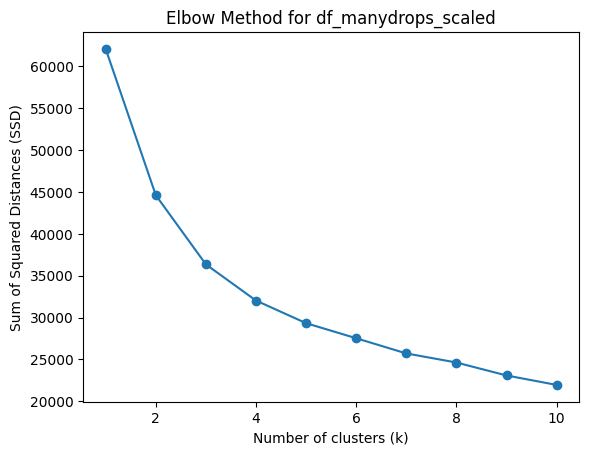

In [ ]:
#Elbow 1
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics

data = df_manydrops_scaled.values
ssd = []

k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(data)
    ssd.append(kmeans.inertia_)
plt.plot(k_values, ssd, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Distances (SSD)')
plt.title('Elbow Method for df_manydrops_scaled')
plt.show()


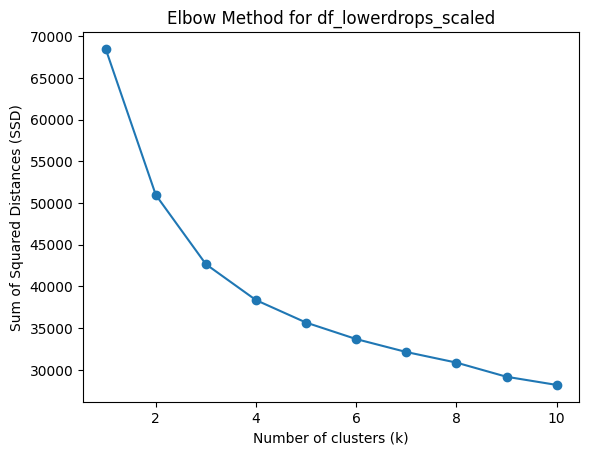

In [ ]:
#Elbow 2
data = df_lowerdrops_scaled.values
ssd = []

k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(data)
    ssd.append(kmeans.inertia_)
plt.plot(k_values, ssd, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Distances (SSD)')
plt.title('Elbow Method for df_lowerdrops_scaled')
plt.show()

In [ ]:
#K-Means model training and showtime:
data_lowerdrops = df_lowerdrops_scaled.values
data_manydrops = df_manydrops_scaled.values

k = 4

kmeans_lowerdrops = KMeans(n_clusters=k, random_state=42)
x = kmeans_lowerdrops.fit(data_lowerdrops)
kmeans_manydrops = KMeans(n_clusters=k, random_state=42)
y = kmeans_manydrops.fit(data_manydrops)



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


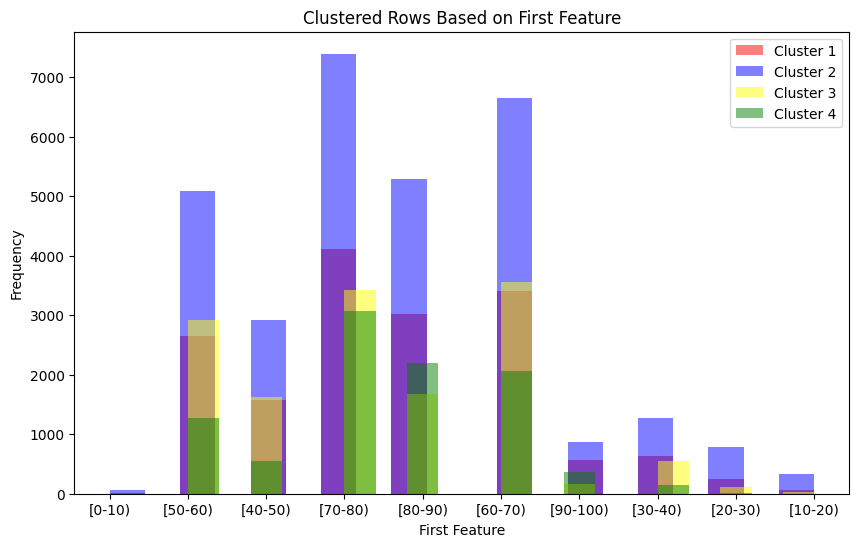

In [ ]:
# showing in histogram. only for Age feature (soal 5)
import matplotlib.pyplot as plt

labels = x.labels_
centers = x.cluster_centers_
colors = ['red', 'blue', 'yellow', 'green']
plt.figure(figsize=(10, 6))

original_data_noscale = df.values


for i in range(k):
    cluster_points = original_data_noscale[labels == i]
    plt.hist(cluster_points[:, 4], bins=20, color=colors[i], alpha=0.5, label=f'Cluster {i+1}')

plt.xlabel('First Feature')
plt.ylabel('Frequency')
plt.title('Clustered Rows Based on First Feature')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import silhouette_score

silhouette_lowerdrops = silhouette_score(data_lowerdrops, x.labels_)
silhouette_manydrops = silhouette_score(data_manydrops, y.labels_)

print("Silhouette coefficient for lowerdrops model:", silhouette_lowerdrops)
print("Silhouette coefficient for manydrops model:", silhouette_manydrops)


Silhouette coefficient for lowerdrops model: 0.31011152601447717
Silhouette coefficient for manydrops model: 0.3588587419875107


In [ ]:
inertia_x = x.inertia_
inertia_y = y.inertia_
print("Inertia of lowerdrops model:", inertia_x)
print("Inertia of manydrops model:", inertia_y)


Inertia of lowerdrops model: 38366.60227123297
Inertia of manydrops model: 32032.281722606756


In [ ]:
from sklearn.metrics import calinski_harabasz_score

calinski_x = calinski_harabasz_score(data_lowerdrops, x.labels_)
calinski_y = calinski_harabasz_score(data_manydrops, y.labels_)
print("Calinski-Harabasz Index of lowerdrops model:", calinski_x)
print("Calinski-Harabasz Index of manydrops model:", calinski_y)


Calinski-Harabasz Index of lowerdrops model: 18497.577137311408
Calinski-Harabasz Index of manydrops model: 22102.957192403446


In [ ]:
#Hierarchical Clustering:
#from sklearn.cluster import AgglomerativeClustering

#clustering_lowerdrops = AgglomerativeClustering(n_clusters=k, memory='./cachefolder_lowerdrops')
#x2 = clustering_lowerdrops.fit_predict(data_lowerdrops)
#clustering_manydrops = AgglomerativeClustering(n_clusters=k, memory='./cachefolder_manydrops')
#y2 = clustering_manydrops.fit_predict(data_manydrops)

#RUNTIME CRUSH: RAM LIMIT

In [ ]:
#from scipy.cluster.hierarchy import fcluster, linkage, dendrogram
#Z = linkage(df_lowerdrops_scaled, method='single', metric='euclidean')
#labels = fcluster(Z, t=k, criterion='maxclust')
#print(labels)
#dendrogram(Z)
#import matplotlib.pyplot as plt
#plt.show()

#RUNTIME CRUSH: RAM LIMIT

In [ ]:
from sklearn.cluster import Birch

birch_lowerdrops = Birch(n_clusters=k)
birch_manydrops = Birch(n_clusters=k)

x2 = birch_lowerdrops.fit(df_lowerdrops_scaled)
y2 = birch_manydrops.fit(df_manydrops_scaled)



In [ ]:
#Soal 9:
#Considering k=4 from step 3 and 4.
from sklearn.decomposition import PCA

pca_lowerdrops = PCA(n_components=k)
pca_manydrops = PCA(n_components=k)

principal_components_lowerdrops = pca_lowerdrops.fit_transform(df_lowerdrops_scaled)
principal_components_manydrops = pca_manydrops.fit_transform(df_manydrops_scaled)

principal_df_lowerdrops = pd.DataFrame(data=principal_components_lowerdrops, columns=['PC1', 'PC2', 'PC3', 'PC4'])
principal_df_manydrops = pd.DataFrame(data=principal_components_manydrops, columns=['PC1', 'PC2', 'PC3', 'PC4'])

result_df_lowerdrops = pd.concat([df_lowerdrops_scaled, principal_df_lowerdrops], axis=1)
result_df_manydrops = pd.concat([df_manydrops_scaled, principal_df_manydrops], axis=1)




In [ ]:
explained_variance_ratio = pca_lowerdrops.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

Explained Variance Ratio: [0.28817887 0.1313471  0.07872952 0.06882245]


In [ ]:
explained_variance_ratio = pca_manydrops.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

Explained Variance Ratio: [0.31655416 0.14444832 0.08684666 0.07591165]


In [ ]:
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import plotly.express as px
#3D Show 1: showing PCA result for lowerdrops_pca
fig = px.scatter_3d(principal_df_lowerdrops, x='PC1', y='PC2', z='PC3', color='PC4')
fig.update_layout(scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'))
fig.show()

In [ ]:
#3D Show 2: showing PCA result for manydrops_pca

fig = px.scatter_3d(principal_df_manydrops, x='PC1', y='PC2', z='PC3', color='PC4')
fig.update_layout(scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'))
fig.show()

In [ ]:
#K-Means model using PCA dataframes:
data_lowerdrops_PCA = principal_df_lowerdrops.values
data_manydrops_PCA = principal_df_manydrops.values

k = 4

kmeans_lowerdrops_pca = KMeans(n_clusters=k, random_state=42)
x_pca = kmeans_lowerdrops_pca.fit(data_lowerdrops_PCA)
kmeans_manydrops_pca = KMeans(n_clusters=k, random_state=42)
y_pca = kmeans_manydrops_pca.fit(data_manydrops)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
#3D Show 3: showing Kmeans result based on lowerdrops_pca
cluster_labels = kmeans_lowerdrops_pca.labels_
df_clusters = pd.DataFrame(data_lowerdrops_PCA, columns=['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4'])
df_clusters['Cluster'] = cluster_labels
cluster_colors = {0: '#FF0000', 1: '#00FF00', 2: '#FFFF00', 3: '#0000FF'}
fig = px.scatter_3d(df_clusters, x='Feature 1', y='Feature 2', z='Feature 3',
                    color='Cluster', color_discrete_map=cluster_colors)
fig.update_traces(marker=dict(size=2))
fig.update_layout(title='K-Means Clustering in 3D Space', scene=dict(xaxis_title='Feature 1',
                                                                   yaxis_title='Feature 2',
                                                                   zaxis_title='Feature 3'))

fig.show()

In [ ]:
#3D Show 3: showing Kmeans result based on manydrops_pca
cluster_labels = kmeans_manydrops_pca.labels_
df_clusters = pd.DataFrame(data_manydrops_PCA, columns=['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4'])
df_clusters['Cluster'] = cluster_labels
cluster_colors = {0: '#FF0000', 1: '#00FF00', 2: '#FFFF00', 3: '#0000FF'}
fig = px.scatter_3d(df_clusters, x='Feature 1', y='Feature 2', z='Feature 3',
                    color='Cluster', color_discrete_map=cluster_colors)
fig.update_traces(marker=dict(size=2))
fig.update_layout(title='K-Means Clustering in 3D Space', scene=dict(xaxis_title='Feature 1',
                                                                   yaxis_title='Feature 2',
                                                                   zaxis_title='Feature 3'))

fig.show()
